In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [13]:
df = pd.read_csv("car_sales_data.csv")


In [14]:
df.head()

,Manufacturer,Model,Engine size,Fuel type,Year of manufacture,Mileage,Price
0,Ford,Fiesta,1.0,Petrol,2002.0,127300,3074
1,Porsche,718 Cayman,4.0,Petrol,2016.0,57850,49704
2,Ford,Mondeo,1.6,Diesel,2014.0,39190,24072
3,Toyota,RAV4,1.8,Hybrid,1988.0,210814,1705
4,VW,Polo,1.0,Petrol,NaN,127869,4101


In [15]:
df.describe()

,Engine size,Year of manufacture,Mileage,Price
count,50000.000000,49998.000000,50000.000000,50000.000000
mean,1.773058,2004.209128,112497.320700,13828.903160
std,0.734108,9.645957,71632.515602,16416.681336
min,1.000000,1984.000000,630.000000,76.000000
25%,1.400000,1996.000000,54352.250000,3060.750000
50%,1.600000,2004.000000,100987.500000,7971.500000
75%,2.000000,2012.000000,158601.000000,19026.500000
max,5.000000,2022.000000,453537.000000,168081.000000


In [16]:
df.dtypes

Manufacturer            object
Model                   object
Engine size            float64
Fuel type               object
Year of manufacture    float64
Mileage                  int64
Price                    int64
dtype: object

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Manufacturer         50000 non-null  object 
 1   Model                50000 non-null  object 
 2   Engine size          50000 non-null  float64
 3   Fuel type            50000 non-null  object 
 4   Year of manufacture  49998 non-null  float64
 5   Mileage              50000 non-null  int64  
 6   Price                50000 non-null  int64  
dtypes: float64(2), int64(2), object(3)
memory usage: 2.7+ MB


In [18]:
print(df.isnull().sum())

Manufacturer           0
Model                  0
Engine size            0
Fuel type              0
Year of manufacture    2
Mileage                0
Price                  0
dtype: int64


In [20]:
print(df[df.isnull().any(axis=1)])

  Manufacturer  Model  Engine size Fuel type  Year of manufacture  Mileage  \
4           VW   Polo          1.0    Petrol                  NaN   127869   
5         Ford  Focus          1.4    Petrol                  NaN    33603   

   Price  
4   4101  
5  29204  


In [21]:
df['Year of manufacture'].fillna(df['Year of manufacture'].median(), inplace=True)


/var/folders/3g/8zkpgjvd5nxb15vgdpg1dhpw0000gn/T/ipykernel_91765/243267206.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Year of manufacture'].fillna(df['Year of manufacture'].median(), inplace=True)


In [23]:
print(df[df.isnull().any(axis=1)])

Empty DataFrame
Columns: [Manufacturer, Model, Engine size, Fuel type, Year of manufacture, Mileage, Price]
Index: []


In [24]:
print(df.isnull().sum())


Manufacturer           0
Model                  0
Engine size            0
Fuel type              0
Year of manufacture    0
Mileage                0
Price                  0
dtype: int64


In [28]:
print(df.duplicated().sum())


12


In [29]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['Manufacturer']=le.fit_transform(df['Manufacturer'])

In [32]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
df[['Mileage', 'Price']] = scaler.fit_transform(df[['Mileage', 'Price']])

In [33]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# Scale 'Mileage' and 'Price'
df[['Mileage', 'Price']] = scaler.fit_transform(df[['Mileage', 'Price']])


In [36]:
from sklearn.model_selection import train_test_split
x= df.drop(['Price'],axis=1)
y = df['Price'] 
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=20,random_state=42)

Text(0, 0.5, 'frequency')

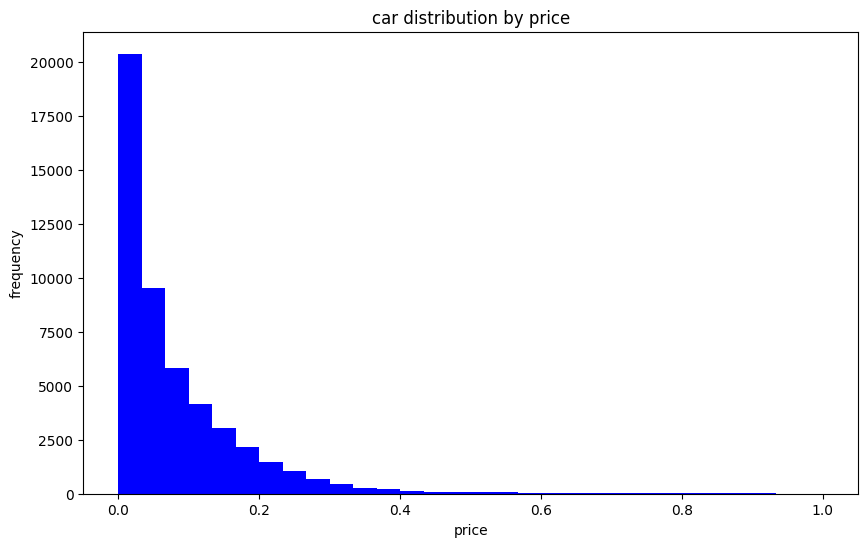

In [38]:
plt.figure(figsize=(10,6))
plt.hist(df['Price'],bins=30,color='blue')
plt.title("car distribution by price")
plt.xlabel("price")
plt.ylabel("frequency")

Text(0, 0.5, 'price')

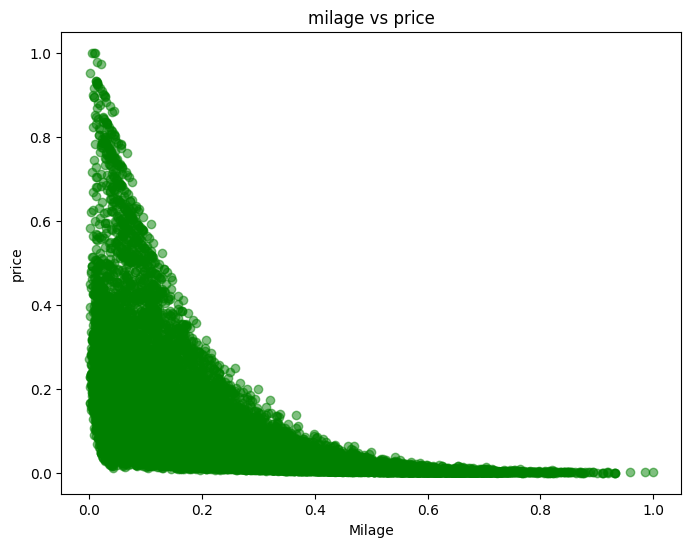

In [40]:
plt.figure(figsize=(8,6))
plt.scatter(df['Mileage'],df['Price'],alpha=0.5,color='green')
plt.title("milage vs price")
plt.xlabel("Milage")
plt.ylabel("price")

Text(0, 0.5, 'Average Price')

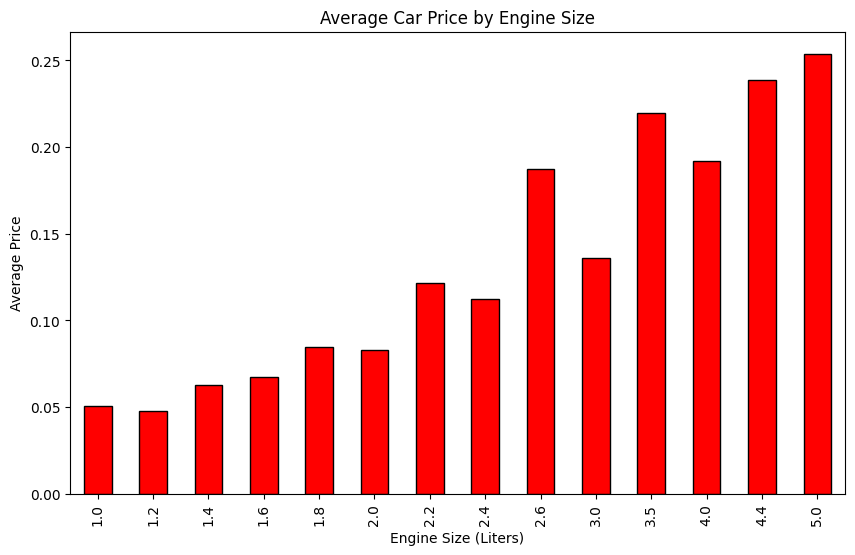

In [46]:

engine_price = df.groupby('Engine size')['Price'].mean()
plt.figure(figsize=(10,6))
engine_price.plot(kind='bar', color='red', edgecolor='black')
plt.title('Average Car Price by Engine Size')
plt.xlabel('Engine Size (Liters)')
plt.ylabel('Average Price')



Text(0.5, 1.0, 'distribution of fuel types')

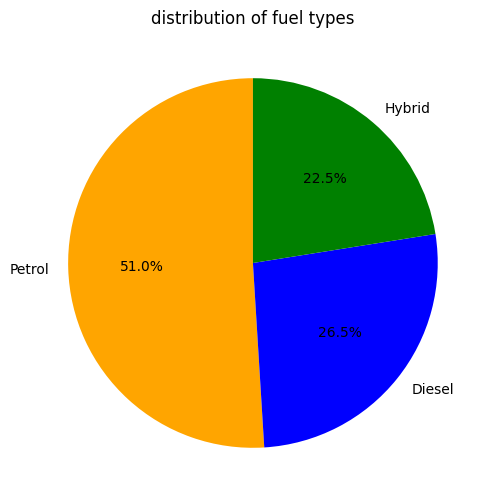

In [47]:
fuel_count= df['Fuel type'].value_counts()
plt.figure(figsize=(8,6))
plt.pie(fuel_count,labels=fuel_count.index,autopct='%1.1f%%',startangle=90,colors=['orange','blue','green'])
plt.title("distribution of fuel types")

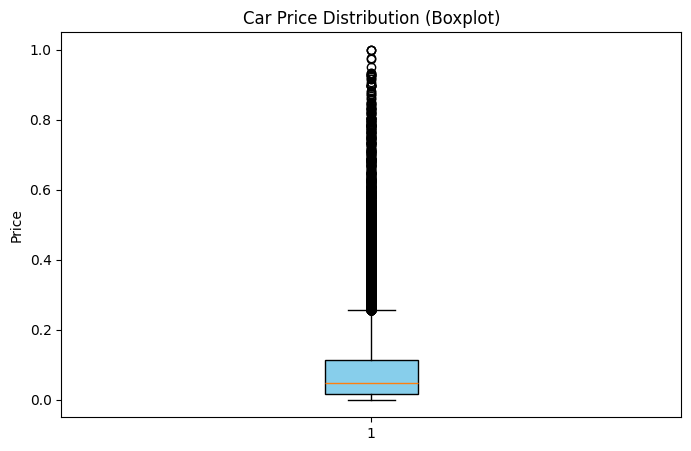

In [50]:
plt.figure(figsize=(8,5))
plt.boxplot(df['Price'].dropna(), vert=True, patch_artist=True, boxprops=dict(facecolor="skyblue"))
plt.title("Car Price Distribution (Boxplot)")
plt.ylabel("Price")
plt.show()

In [54]:
import plotly.express as px
fig=px.box(df,y="Price")
fig.show()

In [55]:
top5 = df['Manufacturer'].value_counts().head(5).index
df_top5 = df[df['Manufacturer'].isin(top5)]

fig = px.box(df_top5, x="Manufacturer", y="Price", 
             title="Car Price Distribution for Top 5 Manufacturers")
fig.show()

In [56]:
px.histogram(df, x="Price", nbins=30, title="Price Distribution")


In [57]:
px.violin(df, x="Fuel type", y="Price", box=True, points="all")


In [58]:
px.line(df, x="Year of manufacture", y="Price", color="Manufacturer")


In [59]:
px.scatter(df, x="Mileage", y="Price", size="Engine size", color="Fuel type")


In [60]:
px.histogram(df, x="Manufacturer", color="Fuel type", barmode="group")


In [61]:
px.pie(df, names="Fuel type", hole=0.4, title="Fuel Type Distribution (Donut)")


In [62]:
px.treemap(df, path=["Manufacturer", "Model"], values="Price")


In [63]:
px.sunburst(df, path=["Manufacturer", "Fuel type"], values="Price")


In [64]:
px.density_heatmap(df, x="Mileage", y="Price", title="Mileage vs Price Density")


In [65]:
px.parallel_coordinates(df, dimensions=["Engine size","Mileage","Price"], color="Price")


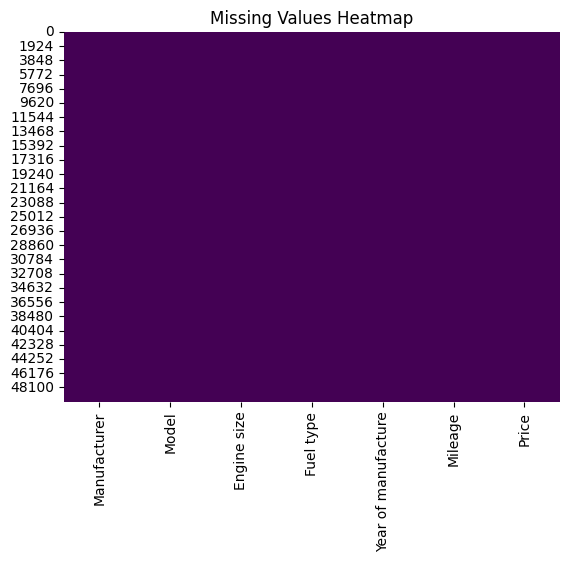

In [66]:
import seaborn as sns
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

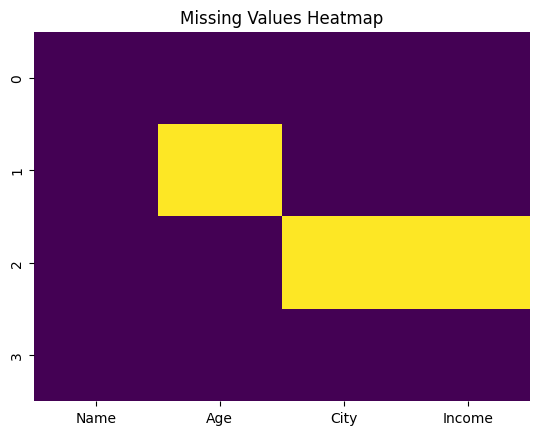

In [67]:
data = {'Name': ['Alice', 'Bob', 'Charlie', 'David'],
'Age': [25, None, 28, 35],
'City': ['New York', 'Los Angeles', None, 'New York'],
'Income': [60000, 75000, None, 90000]}
df= pd.DataFrame(data)
# Visualize missing values using a heatmap
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [70]:
import spacy
nlp=spacy.load("en_core_web_sm")


OSError: [E050] Can't find model 'en_core_web_sm'. It doesn't seem to be a Python package or a valid path to a data directory.

In [69]:
pip install spacy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 1.3 MB/s eta 0:00:00a 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 1.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 1.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 635.7/635.7 kB 1.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 848.5/848.5 kB 1.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 1.3 MB/s eta 0:00:00a 0:00:01
  Created wheel for blis: filename=blis-1.3.0-cp39-cp39-macosx_11_0_arm64.whl size=1244193 sha256=5582fb577e0b0fe4df359e3d581995d1750d1b268bc0b3177aa9b2c1e96e3cc8
  Stored in directory: /Users/anusreev/Library/Caches/pip/wheels/2b/75/f4/e540f5b1ef1d2610200886c45092f5be21cfe8309ccc48c577
Successfully built blis
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [73]:
import spacy
nlp = spacy.load("en_core_web_sm")

OSError: [E050] Can't find model 'en_core_web_sm'. It doesn't seem to be a Python package or a valid path to a data directory.

In [4]:
import spacy

# Load SpaCy's English model
nlp = spacy.load("en_core_web_sm")

# Sample text
text = """Professor John  visited Chennai, then flew to New York for a conference.
he also stopped by Paris and Tokyo before returning to India."""

# Process the text
doc = nlp(text)
print (doc)
print(doc.ents)
# Extract places directly
places = [ent.text for ent in doc.ents if ent.label_ in ("GPE", "LOC")]

print("Identified Places:", set(places))


/Users/anusreev/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


OSError: [E050] Can't find model 'en_core_web_sm'. It doesn't seem to be a Python package or a valid path to a data directory.

In [3]:
pip install spacy

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [5]:
!python -m spacy download en_core_web_sm


/opt/anaconda3/bin/python: No module named spacy


In [2]:
conda activate ml_lab




SyntaxError: invalid syntax (600231551.py, line 1)

In [3]:
python -m spacy download en_core_web_sm


SyntaxError: invalid syntax (1553972540.py, line 1)

In [4]:
!pip install spacy


In [5]:
!python -m spacy download en_core_web_sm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 1.1 MB/s eta 0:00:0000:0100:01m
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [6]:
import spacy

nlp = spacy.load("en_core_web_sm")

text = """Professor John visited Chennai, then flew to New York for a conference.
he also stopped by Paris and Tokyo before returning to India."""

doc = nlp(text)
places = [ent.text for ent in doc.ents if ent.label_ in ("GPE", "LOC")]

print("Identified Places:", set(places))


Identified Places: {'New York', 'Paris', 'Tokyo', 'India'}


In [9]:
def greet_chatbot(user_input):
    doc=nlp(user_input.lower())
    greetings={"hello","hi","how","fine"}
    for token in doc:
        if token.text in greetings:
            return 'hi how can i help you?'
    return "im just greeting bot"
print(greet_chatbot("hello"))
print(greet_chatbot("myre"))

hi how can i help you?
im just greeting bot


In [19]:
import numpy as np

# Step 1: Create random binary image (0s and 1s)
image = np.random.randint(0, 2, size=(16, 16))
print("Original 16x16 Binary Image:\n", image)

# Step 2: Split into 2x2 blocks
blocks = image.reshape(8, 2, 8, 2).swapaxes(1, 2).reshape(-1, 2, 2)

# Step 3: Analyze each block
issues = []
for i, block in enumerate(blocks):
    mean_val = block.mean()
    if mean_val > 1.0:
        issues.append((i, mean_val))

# Step 4: Report results
#print(f"\nTotal blocks with tissue issues (mean > 1): {len(issues)}")
#for idx, val in issues:
    #print(f"Block {idx}: Mean = {val:.2f} → Issue Detected ✅")


Original 16x16 Binary Image:
 [[0 0 1 0 1 0 0 1 0 0 0 1 1 1 0 0]
 [0 0 0 1 0 0 0 1 1 0 1 1 1 1 1 1]
 [1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0]
 [0 0 1 1 0 0 0 1 1 1 1 0 0 1 0 1]
 [1 0 1 1 0 0 0 0 0 0 1 1 1 0 1 0]
 [0 0 1 1 1 1 0 0 1 1 0 0 0 1 1 1]
 [1 1 0 1 1 1 0 0 0 0 1 1 0 1 1 0]
 [1 1 0 1 0 1 1 1 0 0 1 0 1 1 1 0]
 [1 0 1 0 1 1 0 1 0 1 1 1 0 0 0 1]
 [1 1 1 0 1 0 0 0 1 1 0 0 0 1 1 1]
 [1 1 1 0 1 0 1 0 1 1 1 0 0 0 0 1]
 [0 1 0 0 0 1 0 1 0 1 1 1 1 1 1 0]
 [1 0 0 1 0 0 1 0 1 1 0 1 1 0 0 0]
 [1 1 1 0 0 0 0 0 1 1 1 0 0 1 0 0]
 [1 0 0 1 1 1 1 0 0 0 1 1 1 0 0 1]
 [0 1 0 0 0 1 1 1 0 0 0 0 1 1 0 0]]


[0.         0.05050505 0.1010101  0.15151515 0.2020202  0.25252525
 0.3030303  0.35353535 0.4040404  0.45454545 0.50505051 0.55555556
 0.60606061 0.65656566 0.70707071 0.75757576 0.80808081 0.85858586
 0.90909091 0.95959596 1.01010101 1.06060606 1.11111111 1.16161616
 1.21212121 1.26262626 1.31313131 1.36363636 1.41414141 1.46464646
 1.51515152 1.56565657 1.61616162 1.66666667 1.71717172 1.76767677
 1.81818182 1.86868687 1.91919192 1.96969697 2.02020202 2.07070707
 2.12121212 2.17171717 2.22222222 2.27272727 2.32323232 2.37373737
 2.42424242 2.47474747 2.52525253 2.57575758 2.62626263 2.67676768
 2.72727273 2.77777778 2.82828283 2.87878788 2.92929293 2.97979798
 3.03030303 3.08080808 3.13131313 3.18181818 3.23232323 3.28282828
 3.33333333 3.38383838 3.43434343 3.48484848 3.53535354 3.58585859
 3.63636364 3.68686869 3.73737374 3.78787879 3.83838384 3.88888889
 3.93939394 3.98989899 4.04040404 4.09090909 4.14141414 4.19191919
 4.24242424 4.29292929 4.34343434 4.39393939 4.44444444 4.4949

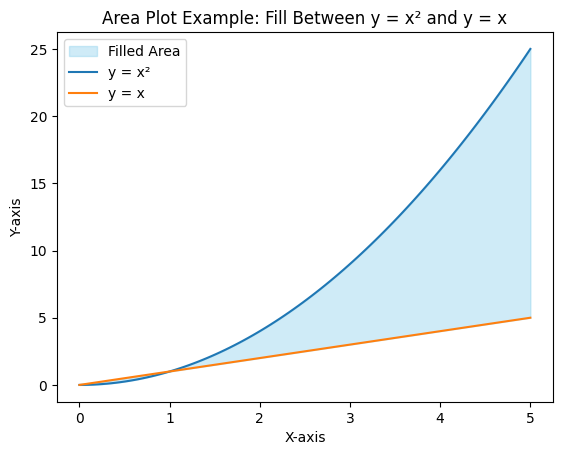

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Generate sample data
x = np.linspace(0, 5, 100)
print(x)
y1 = x**2
y2 = x

# Fill the area between y1 and y2
plt.fill_between(x, y1, y2, color='skyblue', alpha=0.4, label='Filled Area')

# Plot the curves
plt.plot(x, y1, label='y = x²')
plt.plot(x, y2, label='y = x')

# Add labels and title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Area Plot Example: Fill Between y = x² and y = x')
plt.legend()
plt.show()

In [21]:
import requests
import datetime

# Your Windy API key
API_KEY = "3fUU0naF17ttzgsactxQTYpAv0QRwdou"

# Location: Chennai, India
lat = 13.0827
lon = 80.2707

# Windy Point Forecast API endpoint
url = "https://api.windy.com/api/point-forecast/v2"

# Headers with API key
headers = {
    "Content-Type": "application/json",
    "x-windy-key": API_KEY
}

# Payload with required parameters
payload = {
    "lat": lat,
    "lon": lon,
    "model": "gfs",  # Forecast model (GFS = Global Forecast System)
    "parameters": ["temp", "wind", "precip"],  # Request temperature, wind, precipitation
    "levels": ["surface"],  # Surface level forecast
    "key": API_KEY
}

# Make the POST request
response = requests.post(url, json=payload, headers=headers)

if response.status_code == 200:
    data = response.json()
    
    timestamps = data["ts"]  # forecast timestamps
    temp_values = data["temp-surface"]  # surface temperature
    wind_u_values = data["wind_u-surface"]  # wind east-west component
    wind_v_values = data["wind_v-surface"]  # wind north-south component
    rain_values = data["past3hprecip-surface"]  # precipitation
    
    print("Weather Forecast for Chennai:")
    print("-" * 60)
    
    for i in range(len(timestamps)):
        # Convert timestamp from ms → human-readable UTC
        time = datetime.datetime.utcfromtimestamp(timestamps[i] / 1000)
        
        # Convert temperature from Kelvin → Celsius
        temp_celsius = temp_values[i] - 273.15
        
        # Print formatted forecast
        print(f"{time} | Temp: {temp_celsius:.2f}°C | "
              f"Wind u: {wind_u_values[i]:.2f} m/s | "
              f"Wind v: {wind_v_values[i]:.2f} m/s | "
              f"Rain: {rain_values[i]} mm")
else:
    print(f"Error: {response.status_code}")
    print(response.text)




Weather Forecast for Chennai:
------------------------------------------------------------
2025-09-16 09:00:00 | Temp: 29.45°C | Wind u: 0.53 m/s | Wind v: -2.88 m/s | Rain: 3.360829493084538e-06 mm
2025-09-16 12:00:00 | Temp: 28.98°C | Wind u: -3.38 m/s | Wind v: -2.05 m/s | Rain: 1.5024884792613173e-05 mm
2025-09-16 15:00:00 | Temp: 27.18°C | Wind u: 3.52 m/s | Wind v: -1.75 m/s | Rain: 0.0011464741935483492 mm
2025-09-16 18:00:00 | Temp: 30.41°C | Wind u: 4.86 m/s | Wind v: -2.82 m/s | Rain: 0.0003540912442396409 mm
2025-09-16 21:00:00 | Temp: 28.32°C | Wind u: 7.10 m/s | Wind v: -2.37 m/s | Rain: 3.3608294930845345e-06 mm
2025-09-17 00:00:00 | Temp: 29.98°C | Wind u: 4.94 m/s | Wind v: 1.76 m/s | Rain: 0.00012583341013825024 mm
2025-09-17 03:00:00 | Temp: 32.20°C | Wind u: 6.17 m/s | Wind v: -1.00 m/s | Rain: 0 mm
2025-09-17 06:00:00 | Temp: 29.22°C | Wind u: 6.83 m/s | Wind v: -1.60 m/s | Rain: 0.00023929285714275616 mm
2025-09-17 09:00:00 | Temp: 31.43°C | Wind u: 2.92 m/s | Wind

In [24]:
import requests
from bs4 import BeautifulSoup
url='https://viteee.vit.ac.in/'
keywords=['eligibility', 'exam date', 'application fee', 'counselling', 'rank', 'slot booking']
response = requests.get(url)
soup=BeautifulSoup(response.text,'html.parser')
text_blocks=soup.find_all(['p', 'li', 'h1', 'h2', 'h3', 'div'])
print(text_blocks)
for block in text_blocks:
    text=block.get_text(strip=True).lower()
    for keyword in keywords:
        if keyword in text:
            print("found")


[<h1>403 Forbidden</h1>]


In [25]:
from queue import PriorityQueue
pq= PriorityQueue()
pq.put((2,"harry"))
pq.put((3, "Charles"))
pq.put((1, "Riya"))
pq.put((4, "Stacy"))

while not pq.empty():
    print(pq.get())



(1, 'Riya')
(2, 'harry')
(3, 'Charles')
(4, 'Stacy')


In [28]:
from queue import PriorityQueue
customer_query="i want to return my headphones"
responses=[(1, 0.9, 0.2, "You can start a return for your headphones here."),
    (3, 0.8, 0.5, "Looking for new headphones? Check these out."),
    (2, 0.7, 0.6, "Your order is on the way."),
    (1, 0.85, 0.3, "Refunds are processed within 57 business days.")]
pq = PriorityQueue()
for urgency, purchase_score, browse_score, text in responses:
    # Lower urgency = higher priority, so we invert scores for max-heap behavior
    priority = (-urgency, -purchase_score, -browse_score)
    pq.put((priority, text))
top_response = pq.get()[1]
print("💬 Chatbot Response:", top_response)

💬 Chatbot Response: Looking for new headphones? Check these out.


In [29]:

import requests

city = "Chennai"
api_key = "    "  
url = f"http://api.openweathermap.org/data/2.5/weather?q={city}&appid={api_key}&units=metric"

response = requests.get(url)

if response.status_code == 200:
    data = response.json()
    temperature = data['main']['temp']
    weather = data['weather'][0]['description']
    print(f"🌤️ Weather in {city}: {weather}, Temperature: {temperature}°C")
print(response.status_code)

401
